In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

# Reanalysis of "Gene signature driving invasive mucinous adenocarcinoma of the lung" by Guo et al.

Guo, M., Tomoshige, K., Meister, M., Muley, T., Fukazawa, T., Tsuchiya, T., Karns, R., Warth, A., Fink‐Baldauf, I., Nagayasu, T., Naomoto, Y., Xu, Y., Mall, M., Maeda, Y.(2017). Gene signature driving invasive mucinous adenocarcinoma of the lung. EMBO molecular medicine, e201606711. Retrieved from PubMed at https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5376761/.


"The data discussed in this publication have been deposited in NCBI's Gene Expression Omnibus (Guo et al., 2017) and are accessible through GEO Series accession number GSE86956" (https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE86956).


### Data Description

This RNA-seq study uses A549 lung carcinoma cells expressing NKX2-1 infected with Control (pGK), SPDEF or FOXA3-expressing lentivirus. Differentially expressed genes from biological replicates were identified using DESeq2 <a href='#Citations'>[1, 2]</a> .

### Goals of this report
This report aims to analyze the RNA-seq data generated by this study using an [RNA-seq pipeline](https://f1000researchdata.s3.amazonaws.com/manuscripts/9804/8fa2f4e7-d0f3-488c-85f1-0b3a9816faef_9110_-_avi_maaayn.pdf?doi=10.12688/f1000research.9110.1) developed by [the Ma'ayan Lab](http://labs.icahn.mssm.edu/maayanlab/) at [the Icahn School of Medicine at Mount Sinai](http://icahn.mssm.edu/).



## Analysis Overview


#### 1.  <a href='#Dimensionality Reduction'>Dimensionality Reduction</a> 
Dimensionality reduction helps analyze and visualize multidimensional data by reducing the data to 3D space. Principal component analysis (PCA) was applied to the data in this analysis.

#### 2.  <a href='#Interactive Heatmap'>Interactive Heatmap</a>
[Clustergrammer](http://clustergrammer.readthedocs.io/clustergrammer_widget.html) is an interactive tool that can be used to visualize a wide range of biological data. It is particularly useful for gene expression data. Clusters of upregulated and downregulated genes for the groups are clearly visible, which simplifies further analysis and comparisons between differential expression signatures.

#### 3.  <a href='#Differential Expression Analysis'>Differential Expression Analysis</a>
This analysis helps to identify genes that show differences in expression as compared to control. This information can be used to obtain a deeper understanding of the molecular mechanisms of biological processes.

#### 4.  <a href='#Gene Set Enrichment Analysis'>Gene Set Enrichment Analysis</a>
Gene Set Enrichment Analysis uses the upregulated and downregulated genes identified in differential expression analysis to provide valuable insight into the underlying mechanisms of biological processes.

#### 5.  <a href='#Small Molecule Predictions'>Small Molecule Predictions</a>
This analysis produces a set of small molecules that are predicted either mimic or reverse the expression profiles observed in the experiment.


<a id='Dimensionality Reduction'></a>

## 1. Dimensionality Reduction

### Principal Component Analysis (PCA)
PCA was used to reduce the data to three-dimensional space. When applied, a PCA plot is expected to show clusters of samples relevant to experimental groups.


In [12]:
%%capture
# Python packages
import pandas as pd
import sys
import rpy2
import numpy as np
from plotly.offline import init_notebook_mode

# Initialize Plotly and R magic
%load_ext rpy2.ipython

%R require(limma)
%R require(edgeR)
%R require(ggpot)
%R require(gridExtra)

# Custom scripts
sys.path.append('projects')
sys.path.append('scripts')
sys.path.append('gloriascripts')
import archs4
from plots import *

import plot_clustergrammer
import gene_signature


In [13]:
# Activate Plotly
init_notebook_mode()

# Set display option for pandas
pd.set_option('max_colwidth', -1)


rawcount_dataframe=rawcount_dataframe.drop(rawcount_dataframe.index[rawcount_dataframe.mean(axis=1)<=rawcount_dataframe.shape[1]])
rawcount_dataframe_original=rawcount_dataframe.copy(deep=True)

group_dataframe=pd.DataFrame()

group_dataframe_list=sample_title_dict.values()

group_dataframe['treatment']=pd.Series(sample_title_dict.get(v) for v in rawcount_dataframe_original.columns)
group_dataframe['treatment']=pd.Series(v.split(' (GSM')[0] for v in group_dataframe['treatment'])
treatment_dataframe.columns=['treatment']

group_dataframe.index=treatment_dataframe['treatment']
treatment_dataframe.index=group_dataframe['treatment']

rawcount_dataframe.columns=group_dataframe['treatment']


norm_dataframe=pd.DataFrame()
norm_dataframe=rawcount_dataframe.copy(deep=True)

AttributeError: 'NoneType' object has no attribute 'split'

In [10]:
# rawcount_dataframe.columns=group_dataframe['cluster'].tolist()
# rawcount_dataframe=rawcount_dataframe.drop(rawcount_dataframe.index[(np.where(~rawcount_dataframe.any(axis=1))[0])])


rawcount_dataframe=rawcount_dataframe.drop(rawcount_dataframe.index[rawcount_dataframe.mean(axis=1)<=rawcount_dataframe.shape[1]])
rawcount_dataframe_original=rawcount_dataframe.copy(deep=True)

group_dataframe=pd.DataFrame()

group_dataframe_list=sample_title_dict.values()

group_dataframe['treatment']=pd.Series(sample_title_dict.get(v) for v in rawcount_dataframe_original.columns)
group_dataframe['treatment']=pd.Series(v.split(' (GSM')[0] for v in group_dataframe['treatment'])
treatment_dataframe.columns=['treatment']

group_dataframe.index=treatment_dataframe['treatment']
treatment_dataframe.index=group_dataframe['treatment']

rawcount_dataframe.columns=group_dataframe['treatment']


norm_dataframe=pd.DataFrame()
norm_dataframe=rawcount_dataframe.copy(deep=True)



AttributeError: 'NoneType' object has no attribute 'split'

In [11]:
%Rpush rawcount_dataframe
%Rpush group_dataframe
%R design<-model.matrix(~1+treatment, group_dataframe)
%R voom_dataframe<-voom(rawcount_dataframe,design,plot=FALSE)
%R voom_dataframe<-as.data.frame(voom_dataframe)
%Rpull voom_dataframe

#cpm normalizing the columns

cpm_factors=rawcount_dataframe.sum(axis=0)/1000000
for i in range(0,rawcount_dataframe.shape[1]):
    norm_dataframe.iloc[:,i]=rawcount_dataframe.iloc[:,i]/cpm_factors[i]

#z score normalize the rows

from scipy import stats
for rows in range(0,rawcount_dataframe.shape[0]):
    norm_dataframe.iloc[rows,:] = stats.zscore(rawcount_dataframe.iloc[rows,:])

from sklearn.decomposition import PCA
pca_3=PCA(n_components=3)
pca_3.fit_transform(norm_dataframe)

import plot_3d_scatter
fig=plot_3d_scatter.plot_3d_scatter(pca_3.components_[0],pca_3.components_[1],pca_3.components_[2], size=5, color_by=treatment_dataframe['treatment'].tolist(),
xlab= 'PC1 ({:.2%} of variance explained)'.format(pca_3.explained_variance_ratio_[0]),
ylab= 'PC2 ({:.2%} of variance explained)'.format(pca_3.explained_variance_ratio_[1]),
zlab= 'PC3 ({:.2%}of variance explained)'.format(pca_3.explained_variance_ratio_[2]))



Error in `contrasts<-`(`*tmp*`, value = contr.funs[1 + isOF[nn]]) : 
  contrasts can be applied only to factors with 2 or more levels


/usr/local/lib/python2.7/dist-packages/rpy2/robjects/pandas2ri.py:57: UserWarning:

Error while trying to convert the column "treatment". Fall back to string conversion. The error is: Conversion 'py2ri' not defined for objects of type '<type 'NoneType'>'

/usr/local/lib/python2.7/dist-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning:

Error in `contrasts<-`(`*tmp*`, value = contr.funs[1 + isOF[nn]]) : 
  contrasts can be applied only to factors with 2 or more levels


/usr/local/lib/python2.7/dist-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning:

In addition: 

/usr/local/lib/python2.7/dist-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning:

Warning messages:


/usr/local/lib/python2.7/dist-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning:

1: 

/usr/local/lib/python2.7/dist-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning:

In library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE,  :

/usr/local/lib/python2.7/dist

NameError: name 'norm_dataframe' is not defined

#### Figure 1 | PCA analysis of the RNA-seq dataset. 
The dataset includes nine samples of A549 cells infected with pGK, SPDEF and FOXA3 expressing lentivirus (three biological replicates per group). Each point on the graph represents a single sample. The axis represent the principal components, which are linear combinations of the variables from each expression vector. The variance accounted for by each principal component can be seen on the respective axis.

<a id='Interactive Heatmap'></a>

## 2. Interactive Heatmap

500 most variable genes were visualized in this clustergrammer. The names of the samples can be seen as column labels; you can zoom in to see the gene names as rows. The tool is interactive; you can arrange row and column orders by using the panel to the left of the heatmap. The cluster of interest can be selected and the resulting genes can be sent to [Enrichr](http://amp.pharm.mssm.edu/Enrichr/) for further analysis. The clustergrammer instance can be shared and the matrix can be downloaded as a .txt file.

You can learn more about this tool by following the link:

http://clustergrammer.readthedocs.io/clustergrammer_widget.html

In [9]:
import plot_clustergrammer
plot_clustergrammer.display(voom_dataframe)



#### Figure 2 | Interactive heatmap for top 500 most variable genes.
The clustergrammer depicts the normalized expression levels of top 500 most variable genes. The normalization was performed using the voom method in R. The columns represent the sample names, while the rows represent the gene names. The heatmap reveals clusters of upregulated and downregulated genes in FOXA3 and SPDEF expressing cells as compared to control pGK expressing cells.


<a id='Differential Expression Analysis'></a>

## 3. Differential Expression Analysis


In [8]:
# Set experimental design

from rpy2.robjects import r, pandas2ri
import pandas as pd
import sys

r.source('scripts/signature.R')
pandas2ri.activate()


rawcount_dataframe.columns=sample_numbers.tolist()

experimental_samples_foxa3 = ['GSM2310990','GSM2310991','GSM2310992']
experimental_samples_spdef = ['GSM2310993','GSM2310994','GSM2310995']

control_samples = ['GSM2310987','GSM2310988','GSM2310989']

limma_dataframe_foxa3=gene_signature.signature(rawcount_dataframe=rawcount_dataframe,method = 'limma',
                                               experimental_samples=experimental_samples_foxa3,control_samples=control_samples)

# limma_foxa3_up=limma_dataframe_foxa3.loc[limma_dataframe_foxa3['logFC']>0].sort_values('adj.P.Val',axis=0,ascending=False)[:500]


limma_dataframe_spdef=gene_signature.signature(rawcount_dataframe,method = 'limma',
                                    experimental_samples=experimental_samples_spdef,
                                    control_samples=control_samples)


### 3.1 Volcano Plots

Limma package in R was used to obtain differential gene expression signatures.You can learn more about the package by following the link: https://bioconductor.org/packages/release/bioc/html/limma.html


A volcano plot visualizes the results of gene expression analysis and depicts the logarithm of P-values (-log10(P-value)) on the y-axis versus log-transformed fold changes (logFC) on the x-axis.

In [9]:
limma_dataframe_foxa3['significant']=[rowData['adj.P.Val'] < 0.2 and abs(rowData['logFC']) > 1 for index, rowData in limma_dataframe_foxa3.iterrows()]
limma_dataframe_spdef['significant']=[rowData['adj.P.Val'] < 0.2 and abs(rowData['logFC']) > 1 for index, rowData in limma_dataframe_spdef.iterrows()]
foxa3_sign=limma_dataframe_foxa3[limma_dataframe_foxa3['significant']==True]
foxa3_insign=limma_dataframe_foxa3[limma_dataframe_foxa3['significant']==False]
spdef_sign=limma_dataframe_spdef[limma_dataframe_spdef['significant']==True]
spdef_insign=limma_dataframe_spdef[limma_dataframe_spdef['significant']==False]


In [10]:
import customplot
customplot.double_volcano(foxa3_sign['logFC'],-np.log10(foxa3_sign['P.Value']),foxa3_insign['logFC'],-np.log10(foxa3_insign['P.Value']),spdef_sign['logFC'],-np.log10(spdef_sign['P.Value']),spdef_insign['logFC'],-np.log10(spdef_insign['P.Value']),name_sign='Significant genes',name_insign='Not significant genes',title1=' FOXA3',title2='SPDEF',size=12,major_title='Volcano plots for SPDEF and FOXA3 overexpressing cells as compared to control (pGK expressing cells)',xaxis='Log-transformed fold changes (logFC)',yaxis='- Log of P-value')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



#### Figure 3 | Volcano plots for the RNA-seq dataset.  
Volcano plot depicts the log of P-value for each gene verus log-transformed fold changes as compared to the control samples. The volcano plot shows the genes identified as significant (colored in red) and not significant (colored in blue). Limma method in R along with the thresholds (|logFC| > 1.5 and adjusted P-value < 0.1) were used to identify the significant genes.


### 3.2 MA Plots

MA plot depicts the log-transformed fold changes (M) for each gene versus its average expression (A). Fold changes and average expressions were calculated using limma package in R.

In [44]:
list_foxa3_sign_up=limma_dataframe_foxa3[(limma_dataframe_foxa3['logFC']>0) & (limma_dataframe_foxa3['significant']==True)].index
list_foxa3_sign_dn=limma_dataframe_foxa3[(limma_dataframe_foxa3['logFC']<0) & (limma_dataframe_foxa3['significant']==True)].index


list_spdef_sign_up=limma_dataframe_spdef[(limma_dataframe_spdef['logFC']>0) & (limma_dataframe_spdef['significant']==True)].index
list_spdef_sign_dn=limma_dataframe_spdef[(limma_dataframe_spdef['logFC']<0) & (limma_dataframe_spdef['significant']==True)].index

                                                        
                                                                                            

df_foxa3_sign_up = pd.DataFrame({'Significant Upregulated Genes in FOXA3 Expressing Cells':list_foxa3_sign_up, 'Log-transformed fold changes': limma_dataframe_foxa3.loc[list_foxa3_sign_up]['logFC'],'Adjusted P-value':limma_dataframe_foxa3.loc[list_foxa3_sign_up]['adj.P.Val']})
df_foxa3_sign_up=df_foxa3_sign_up[['Significant Upregulated Genes in FOXA3 Expressing Cells','Log-transformed fold changes','Adjusted P-value']]


df_foxa3_sign_dn = pd.DataFrame({'Significant Downregulated Genes in FOXA3 Expressing Cells':list_foxa3_sign_dn, 'Log-transformed fold changes': limma_dataframe_foxa3.loc[list_foxa3_sign_dn]['logFC'],'Adjusted P-value':limma_dataframe_foxa3.loc[list_foxa3_sign_dn]['adj.P.Val']})
df_foxa3_sign_dn=df_foxa3_sign_dn[['Significant Downregulated Genes in FOXA3 Expressing Cells','Log-transformed fold changes','Adjusted P-value']]


df_spdef_sign_up = pd.DataFrame({'Significant Upregulated Genes in SPDEF Expressing Cells':list_spdef_sign_up,'Log-transformed fold changes': limma_dataframe_spdef.loc[list_spdef_sign_up]['logFC'],'Adjusted P-value':limma_dataframe_spdef.loc[list_spdef_sign_up]['adj.P.Val']})
df_spdef_sign_up=df_spdef_sign_up[['Significant Upregulated Genes in SPDEF Expressing Cells','Log-transformed fold changes','Adjusted P-value']]


df_spdef_sign_dn = pd.DataFrame({'Significant Downregulated Genes in SPDEF Expressing Cells':list_spdef_sign_dn,'Log-transformed fold changes': limma_dataframe_spdef.loc[list_spdef_sign_dn]['logFC'],'Adjusted P-value':limma_dataframe_spdef.loc[list_spdef_sign_dn]['adj.P.Val']})
df_spdef_sign_dn=df_spdef_sign_dn[['Significant Downregulated Genes in SPDEF Expressing Cells','Log-transformed fold changes','Adjusted P-value']]


In [45]:
import customplot
customplot.double_volcano(foxa3_sign['AveExpr'],foxa3_sign['logFC'],x_insign1=foxa3_insign['AveExpr'],y_insign1=foxa3_insign['logFC'],x_sign2=spdef_sign['AveExpr'],y_sign2=spdef_sign['logFC'],x_insign2=spdef_insign['AveExpr'],y_insign2=spdef_insign['logFC'],name_sign='Significant genes',name_insign='Not significant genes',title1='FOXA3',title2='SPDEF',size=12,major_title='MA plots for SPDEF and FOXA3 overexpressing cells as compared to control (pGK expressing cells)',xaxis='Average gene expression (A)',yaxis='Log-transformed fold changes-logFC (M)')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



#### Figure 4 | MA plots for the RNA-seq dataset.  
MA plot depicts the log-transformed fold changes (M) for each gene versus average gene expression (A), calculated by limma package in R.The MA plot shows the genes identified as significant (colored in red) and not significant (colored in blue). Limma method in R along with the thresholds (|logFC| > 1.5 and adjusted P-value < 0.1) were used to identify the significant genes.

### 3.3 Further exploration of significant genes identified by limma

By using limma, we identified potentially significant genes that are induced or supressed by FOXA3 and SPDEF.

##### Exploring siginificant  induced genes in FOXA3 or SPDEF expressing A549 cells as compared to pGK expressing cells (control)

The following tables show significant upregulated genes in FOXA3 or SPDEF expressing cells as compared to control samples (pGK expressing cells). You can scroll and search for genes of interest by using the toolbar in the tables. None of the downregulated genes were found significant.

In [46]:
df_foxa3_sign_up.index=range(1,len(df_foxa3_sign_up)+1)

In [47]:
import qgrid
qgrid.nbinstall(overwrite=True)
qgrid.set_defaults(show_toolbar=True, remote_js=True,export_mode=True)
qgrid.show_grid(df_foxa3_sign_up)

#### Table 1 | Significant upregulated genes in FOXA3 expressing cells identified by limma as compared to control samples (pGK expressing cells)
The table shows the list of significant upregulated genes in FOXA3 expressing cells as compared to pGK expressing cells. Limma method in R along with the thresholds (logFC > 1 and adjusted P-value < 0.2) were used to identify the significant genes.

In [48]:
df_spdef_sign_up.index=range(1,len(df_spdef_sign_up)+1)
qgrid.show_grid(df_spdef_sign_up)

#### Table 2 | Significant upregulated genes in SPDEF expressing cells identified by limma as compared to control samples (pGK expressing cells)
The table shows the list of significant upregulated genes in SPDEF expressing cells as compared to pGK expressing cells. Limma method in R along with the thresholds (logFC > 1 and adjusted P-value < 0.2) were used to identify the significant genes.

### 3.4 Differential expression analysis with Characteristic Direction method

The differential gene expression signatures are now computed with Characteristic Direction (CD) method and top 100 upregulated and downregulated genes in FOXA3 and SPDEF expressing cells were selected for further analysis. 

You can learn more about the Characteristic Direction method by inspecting the following publication: https://bmcbioinformatics.biomedcentral.com/articles/10.1186/1471-2105-15-79


In [49]:
cd_dataframe_foxa3 = gene_signature.signature(rawcount_dataframe,
                                 method = 'CD',
                                 experimental_samples = experimental_samples_foxa3,
                                 control_samples = control_samples)

cd_dataframe_spdef = gene_signature.signature(rawcount_dataframe,
                                 method = 'CD',
                                 experimental_samples = experimental_samples_spdef,
                                 control_samples = control_samples)

cd_dataframe_foxa3.sort_values('CD',axis=0,ascending=True)
cd_dataframe_spdef.sort_values('CD',axis=0,ascending=True)



# (2) take the top 500 top and bottom genes

top_500_foxa3=cd_dataframe_foxa3.sort_values('CD',axis=0,ascending=False)[:500].index
top_500_spdef=cd_dataframe_spdef.sort_values('CD',axis=0,ascending=False)[:500].index

bottom_500_foxa3=cd_dataframe_foxa3.sort_values('CD',axis=0,ascending=False).tail(500).index
bottom_500_spdef=cd_dataframe_spdef.sort_values('CD',axis=0,ascending=False).tail(500).index



In [50]:
#taking top 100 upregulated and downregulated genes for comparison

df_top_100_foxa3=cd_dataframe_foxa3.loc[top_500_foxa3[:100]]
df_top_100_foxa3['Top 100 upregulated genes in FOXA3 expressing cells']=df_top_100_foxa3.index
df_top_100_foxa3.columns=['CD score','Top 100 upregulated genes in FOXA3 expressing cells']
df_top_100_foxa3.index=range(1,len(df_top_100_foxa3)+1)
df_top_100_foxa3=df_top_100_foxa3[['Top 100 upregulated genes in FOXA3 expressing cells','CD score']]


df_bottom_100_foxa3=cd_dataframe_foxa3.loc[bottom_500_foxa3[100:]]
df_bottom_100_foxa3['Top 100 downregulated genes in FOXA3 expressing cells']=df_bottom_100_foxa3.index
df_bottom_100_foxa3.columns=['CD score','Top 100 downregulated genes in FOXA3 expressing cells']
df_bottom_100_foxa3.index=range(1,len(df_bottom_100_foxa3)+1)
df_bottom_100_foxa3=df_bottom_100_foxa3[['Top 100 downregulated genes in FOXA3 expressing cells','CD score']]


df_top_100_spdef=cd_dataframe_spdef.loc[top_500_spdef[:100]]
df_top_100_spdef['Top 100 upregulated genes in SPDEF expressing cells']=df_top_100_spdef.index
df_top_100_spdef.columns=['CD score','Top 100 upregulated genes in SPDEF expressing cells']
df_top_100_spdef.index=range(1,len(df_top_100_spdef)+1)
df_top_100_spdef=df_top_100_spdef[['Top 100 upregulated genes in SPDEF expressing cells','CD score']]


df_bottom_100_spdef=cd_dataframe_spdef.loc[bottom_500_spdef[100:]]
df_bottom_100_spdef['Top 100 downregulated genes in SPDEF expressing cells']=df_bottom_100_spdef.index
df_bottom_100_spdef.columns=['CD score','Top 100 downregulated genes in SPDEF expressing cells']
df_bottom_100_spdef.index=range(1,len(df_bottom_100_spdef)+1)
df_bottom_100_spdef=df_bottom_100_spdef[['Top 100 downregulated genes in SPDEF expressing cells','CD score']]



In [51]:
qgrid.show_grid(df_top_100_foxa3)

#### Table 3  | Top 100 upregulated genes in FOXA3 expressing cells identified by CD method

The table shows the list of top 100 upregulated genes in FOXA3 expressing cells as compared to pGK expressing cells. Characteristic Direction method was used to identify the genes.

In [52]:
qgrid.show_grid(df_top_100_spdef)

#### Table 4  | Top 100 upregulated genes in SPDEF expressing cells identified by CD method

The table shows the list of top 100 upregulated genes in SPDEF expressing cells as compared to pGK expressing cells. Characteristic Direction method was used to find identify the genes.

In [53]:
qgrid.show_grid(df_bottom_100_foxa3)

#### Table 5  | Top 100 downregulated genes in FOXA3 expressing cells identified by CD method

The table shows the list of top 100 downregulated genes in FOXA3 expressing cells as compared to pGK expressing cells. Characteristic Direction method was used to identify the genes.

In [54]:
qgrid.show_grid(df_bottom_100_spdef)

#### Table 6 | Top 100 downregulated genes in SPDEF expressing cells identified by CD method

The table shows the list of top 100 downregulated genes in SPDEF expressing cells as compared to pGK expressing cells. Characteristic Direction method was used to identify the genes.

##### Exploring siginificant  common induced and repressed genes in FOXA3 or SPDEF expressing A549 cells as compared to pGK expressing cells (control)

In [55]:
# list_top_100_foxa3=pd.Series(df_top_100_foxa3.index)
# list_top_100_spdef=pd.Series(df_top_100_spdef.index)

list_top_100_foxa3=pd.Series(df_top_100_foxa3['Top 100 upregulated genes in FOXA3 expressing cells'])
list_top_100_spdef=pd.Series(df_top_100_spdef['Top 100 upregulated genes in SPDEF expressing cells'])

list_bottom_100_foxa3=pd.Series(df_bottom_100_foxa3['Top 100 downregulated genes in FOXA3 expressing cells'])
list_bottom_100_spdef=pd.Series(df_bottom_100_spdef['Top 100 downregulated genes in SPDEF expressing cells'])


foxa_spdef_up_intersection=list(set(list_top_100_foxa3).intersection(list_top_100_spdef))
foxa_spdef_dn_intersection=list(set(list_bottom_100_foxa3).intersection(list_bottom_100_spdef))


df_bottom_100_foxa3=cd_dataframe_foxa3.loc[bottom_500_foxa3[100:]]
df_bottom_100_foxa3['Top 100 downregulated genes in FOXA3 expressing cells']=df_bottom_100_foxa3.index
df_bottom_100_foxa3.columns=['CD score','Top 100 downregulated genes in FOXA3 expressing cells']
df_bottom_100_foxa3.index=range(1,len(df_bottom_100_foxa3)+1)
df_bottom_100_foxa3=df_bottom_100_foxa3[['Top 100 downregulated genes in FOXA3 expressing cells','CD score']]

df_foxa_spdef_up_intersection=pd.DataFrame()
df_foxa_spdef_dn_intersection=pd.DataFrame()

df_foxa_spdef_up_intersection['Common upregulated genes in FOXA3 and SPDEF expressing cells']=foxa_spdef_up_intersection
df_foxa_spdef_dn_intersection['Common downregulated genes in FOXA3 and SPDEF expressing cells']=foxa_spdef_dn_intersection



df_foxa_spdef_up_intersection=pd.DataFrame({'Common upregulated genes in FOXA3 and SPDEF expressing cells' : foxa_spdef_up_intersection,'CD score':cd_dataframe_foxa3.loc[foxa_spdef_up_intersection]['CD'] })

df_foxa_spdef_dn_intersection=pd.DataFrame({'Common downregulated genes in FOXA3 and SPDEF expressing cells' : foxa_spdef_dn_intersection, 'CD score' :cd_dataframe_foxa3.loc[foxa_spdef_dn_intersection]['CD']  })


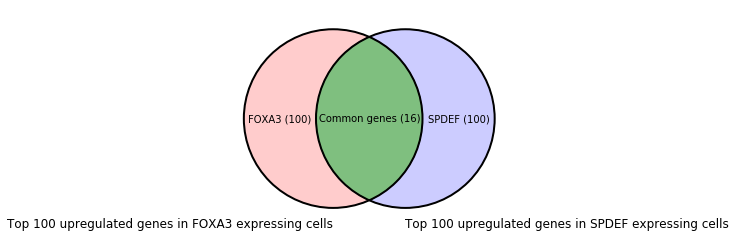

In [56]:
import customplot
customplot.venn(in_label1='FOXA3 (100)',in_label2='SPDEF (100)',inter_label='Common genes (16)',name1='Top 100 upregulated genes in FOXA3 expressing cells',name2='Top 100 upregulated genes in SPDEF expressing cells',color1='red',color2='blue',color_inter='green')

#### Figure 5 | Venn diagram depicting the intersecting region between top 100 upregulated genes in SPDEF and FOXA3 expressing cells and the number of genes in each region.
As seen from the venn diagram, there are 16 common significant upregulated genes identified in SPDEF and FOXA3 expressing cells.

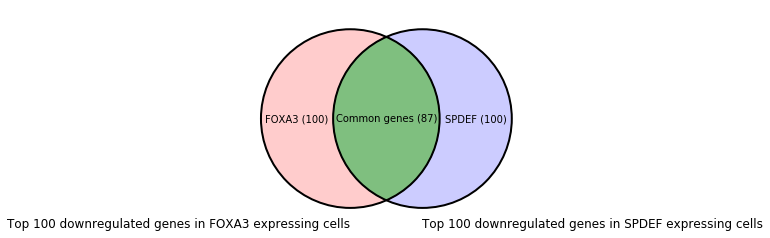

In [57]:
import customplot
customplot.venn(in_label1='FOXA3 (100)',in_label2='SPDEF (100)',inter_label='Common genes (87)',name1='Top 100 downregulated genes in FOXA3 expressing cells',name2='Top 100 downregulated genes in SPDEF expressing cells',color1='red',color2='blue',color_inter='green')

#### Figure 6 | Venn diagram depicting the intersecting region between top 100 downregulated genes in SPDEF and FOXA3 expressing cells and the number of genes in each region.
As seen from the venn diagram, there are 87 common significant downregulated genes identified in SPDEF and FOXA3 expressing cells.

In [58]:
df_foxa_spdef_up_intersection.index=range(1,len(df_foxa_spdef_up_intersection)+1)

qgrid.show_grid(df_foxa_spdef_up_intersection)

#### Table 7 | Common upregulated genes in FOXA3 and SPDEF expressing cells identified by CD method

The table shows the list of common upregulated genes in FOXA3 and SPDEF expressing cells as compared to pGK expressing cells. Characteristic Direction method was used to identify the genes.

In [60]:
df_foxa_spdef_dn_intersection.index=range(1,len(df_foxa_spdef_dn_intersection)+1)
qgrid.show_grid(df_foxa_spdef_dn_intersection)

#### Table 8 | Common downregulated genes in FOXA3 and SPDEF expressing cells identified by CD method

The table shows the list of common downregulated genes in FOXA3 and SPDEF expressing cells as compared to pGK expressing cells. Characteristic Direction method was used to identify the genes.

<a id='Gene Set Enrichment Analysis'></a>

## 4. Gene Set Enrichment Analysis

Enrichr is a comprehensive gene set enrichment analysis tool. Containing 180 184 annotated gene sets from 102 gene set libraries, it allows for easy and effective search and provides interactive visualizations of enrichment results. <a href='#Citations'>[3]</a>. 

You can learn more and freely use Enrichr by following the link: http://amp.pharm.mssm.edu/Enrichr/. 

A more detailed desription of Enrichr can be found in this publication: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4987924/

In [61]:
import upload_genesets
dict_up_foxa3=upload_genesets.enrichr(top_500_foxa3)[1]
dict_dn_foxa3=upload_genesets.enrichr(bottom_500_foxa3)[1]
dict_up_spdef=upload_genesets.enrichr(top_500_spdef)[1]
dict_dn_spdef=upload_genesets.enrichr(bottom_500_spdef)[1]

user_list_id_up_foxa3 = dict_up_foxa3.get('userListId')
user_list_id_dn_foxa3=dict_dn_foxa3.get('userListId')

user_list_id_up_spdef = dict_up_spdef.get('userListId')
user_list_id_dn_spdef=dict_dn_spdef.get('userListId')


import enrichr_library
up_foxa3_chea,dn_foxa3_chea=enrichr_library.data(gene_set_library='ChEA_2016',user_list_id_up=user_list_id_up_foxa3,user_list_id_dn=user_list_id_dn_foxa3)
up_foxa3_bio_process,dn_foxa3_bio_process=enrichr_library.data(gene_set_library='GO_Biological_Process_2017b',user_list_id_up=user_list_id_up_foxa3,user_list_id_dn=user_list_id_dn_foxa3)
up_foxa3_kegg,dn_foxa3_kegg=enrichr_library.data(gene_set_library='KEGG_2016',user_list_id_up=user_list_id_up_foxa3,user_list_id_dn=user_list_id_dn_foxa3)

up_spdef_chea,dn_spdef_chea=enrichr_library.data(gene_set_library='ChEA_2016',user_list_id_up=user_list_id_up_spdef,user_list_id_dn=user_list_id_dn_spdef)
up_spdef_bio_process,dn_spdef_bio_process=enrichr_library.data(gene_set_library='GO_Biological_Process_2017b',user_list_id_up=user_list_id_up_spdef,user_list_id_dn=user_list_id_dn_spdef)
up_spdef_kegg,dn_spdef_kegg=enrichr_library.data(gene_set_library='KEGG_2016',user_list_id_up=user_list_id_up_spdef,user_list_id_dn=user_list_id_dn_spdef)



enrichr_url_up_foxa3=upload_genesets.enrichr(top_500_foxa3)[0]
enrichr_url_up_spdef=upload_genesets.enrichr(top_500_spdef)[0]

enrichr_url_dn_foxa3=upload_genesets.enrichr(bottom_500_foxa3)[0]
enrichr_url_dn_spdef=upload_genesets.enrichr(bottom_500_spdef)[0]

enrichr_url_both_up_foxa3_spdef=upload_genesets.enrichr(foxa_spdef_up_intersection)[0]
enrichr_url_both_dn_foxa3_spdef=upload_genesets.enrichr(foxa_spdef_dn_intersection)[0]


### 4.1 Explore Enrichr Results

In [62]:
df = pd.DataFrame([enrichr_url_up_foxa3,enrichr_url_dn_foxa3,enrichr_url_up_spdef,enrichr_url_dn_spdef,enrichr_url_both_up_foxa3_spdef,enrichr_url_both_dn_foxa3_spdef])

def make_clickable(val):
    return '<a href="{}">{}</a>'.format(val,val)

df.index=['Upregulated genes in FOXA3 expressing cells','Downregulated genes in FOXA3 expressing cells','Upregulated genes in SPDEF expressing cells','Downregulated genes in SPDEF expressing cells','Common upregulated genes in both SPDEF and FOXA3 expressing cells','Common downregulated genes in both SPDEF and FOXA3 expressing cells']
df.columns=['Links to full Enrichr results']
df.style.format(make_clickable)


,Links to full Enrichr results
Upregulated genes in FOXA3 expressing cells,http://amp.pharm.mssm.edu/Enrichr/enrich?dataset=2q4hz
Downregulated genes in FOXA3 expressing cells,http://amp.pharm.mssm.edu/Enrichr/enrich?dataset=2q4i1
Upregulated genes in SPDEF expressing cells,http://amp.pharm.mssm.edu/Enrichr/enrich?dataset=2q4i0
Downregulated genes in SPDEF expressing cells,http://amp.pharm.mssm.edu/Enrichr/enrich?dataset=2q4i2
Common upregulated genes in both SPDEF and FOXA3 expressing cells,http://amp.pharm.mssm.edu/Enrichr/enrich?dataset=2q4i3
Common downregulated genes in both SPDEF and FOXA3 expressing cells,http://amp.pharm.mssm.edu/Enrichr/enrich?dataset=2q4i4


#### Table 9 | Links to full Enrichr results
The table includes the links to full Enrichr results for top 500 upregulated and downregulated genes in FOXA3 and SPDEF expressing cell identified by CD method as compared to control samples (pGK expressing cells).

### 4.2 Transcription - ChEA 2016

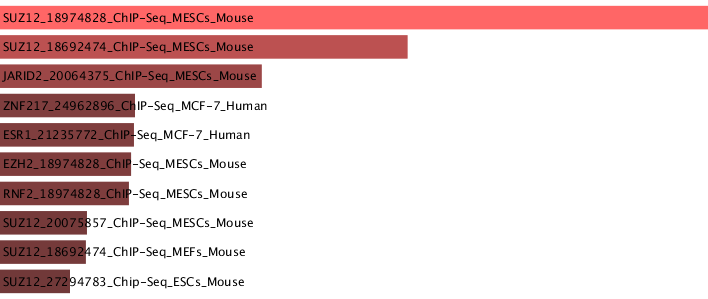

In [33]:
from IPython.display import Image
Image(filename='ChEA_foxa_up_bar_graph.png')

#### Figure 7 | Gene Set Enrichment results from ChEA 2016 library for upregulated genes in FOXA3 overexpressing cells


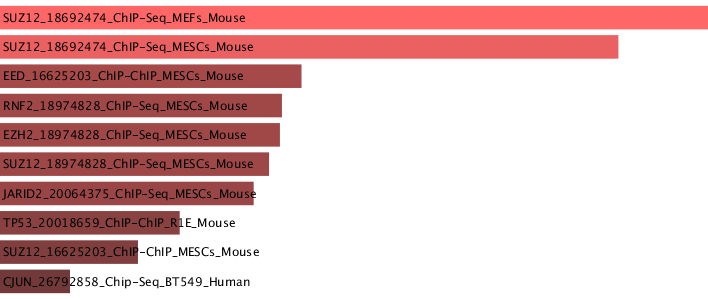

In [72]:
Image(filename='ChEA_foxa_dn_bar_graph.png')

#### Figure 8 | Gene Set Enrichment results from ChEA 2016 library for downregulated genes in FOXA3 expressing cells
regulated genes in FOXA3 overexpressing cells

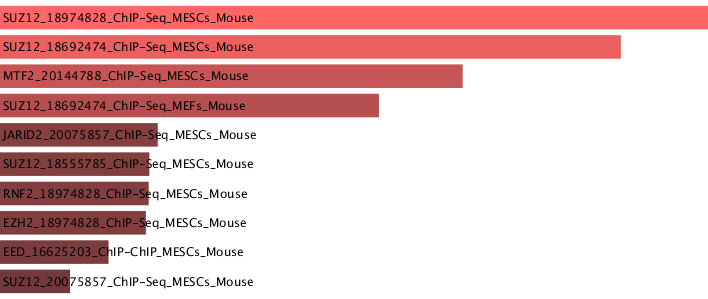

In [73]:
Image(filename='ChEA_spdef_up_graph.png')

#### Figure 9 | Gene Set Enrichment results from ChEA 2016 library for upregulated genes in SPDEF overexpressing cells

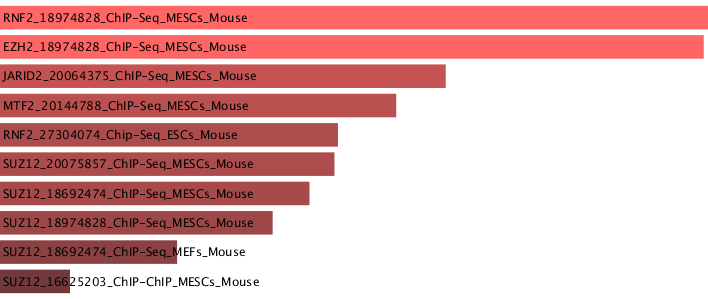

In [74]:
Image(filename='ChEA_spdef_dn_graph.png')

#### Figure 10 | Gene Set Enrichment results from ChEA 2016 library for downregulated genes in SPDEF overexpressing cells

### 4.3 Gene Ontology - Biological Process

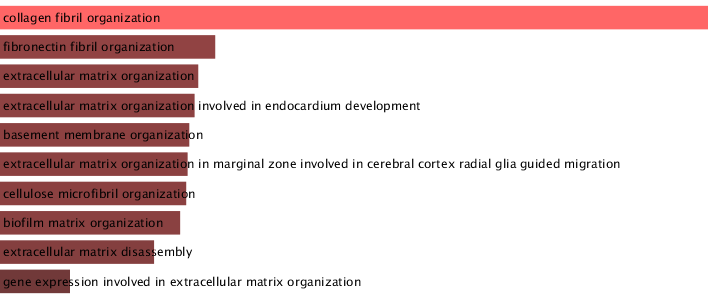

In [75]:
Image(filename='GO_Biological_Process_foxa_up_bar_graph.png')

#### Figure 11 | Gene Set Enrichment results from GO Biological Process library for upregulated genes in FOXA3 overexpressing cells

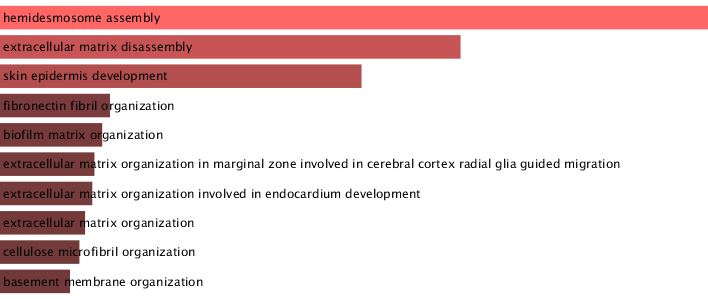

In [76]:
Image(filename='GO_Biological_Process_foxa_dn_graph.png')

#### Figure 12 | Gene Set Enrichment results from GO Biological Process library for downregulated genes in FOXA3 overexpressing cells

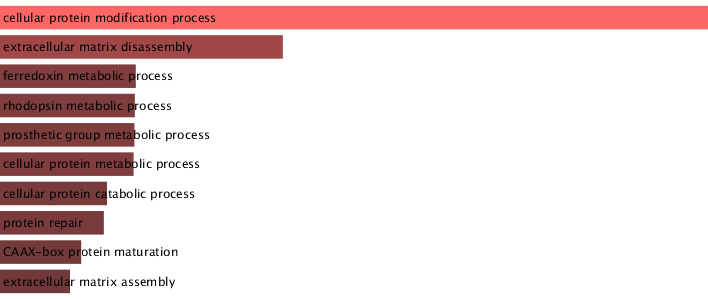

In [77]:
Image(filename='GO_Biological_Process_spdef_up_graph.png')

#### Figure 13 | Gene Set Enrichment results from GO Biological Process library for upregulated genes in SPDEF overexpressing cells

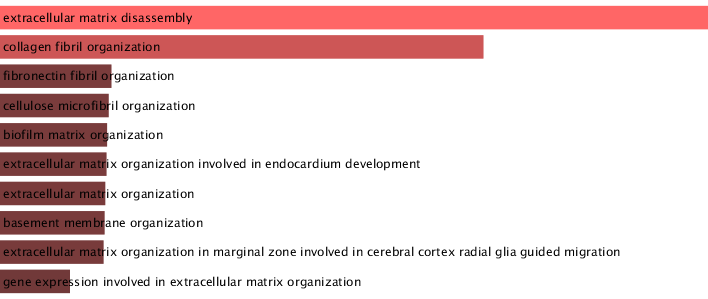

In [78]:
Image(filename='GO_Biological_Process_spdef_dn_graph.png')

#### Figure 14 | Gene Set Enrichment results from GO Biological Process library for downregulated genes in SPDEF overexpressing cells

### 4.4 Pathways- KEGG 2016

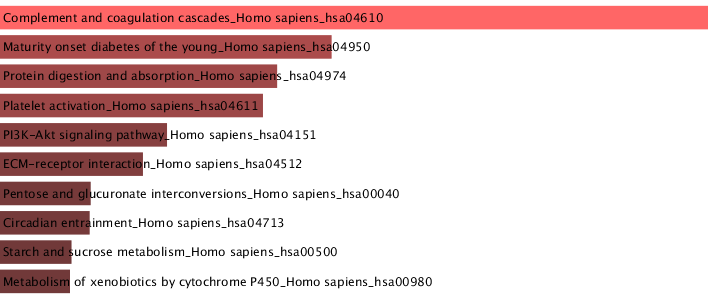

In [79]:
Image(filename='KEGG_foxa_up_bar_graph.png')

#### Figure 15 | Gene Set Enrichment results from KEGG 2016 library for upregulated genes in FOXA3 overexpressing cells

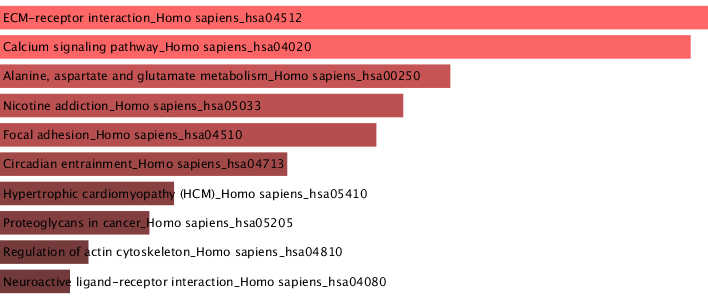

In [80]:
Image(filename='KEGG_2foxa_dn_graph.png')

#### Figure 16 | Gene Set Enrichment results from KEGG 2016 library for downregulated genes in FOXA3 overexpressing cells

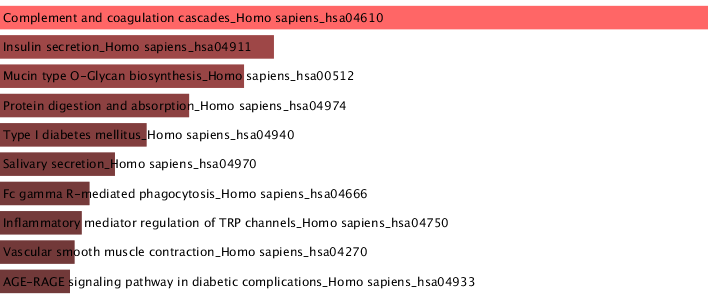

In [81]:
Image(filename='KEGG_spdef_up_graph.png')

#### Figure 17 | Gene Set Enrichment results from KEGG 2016 library for upregulated genes in SPDEF overexpressing cells

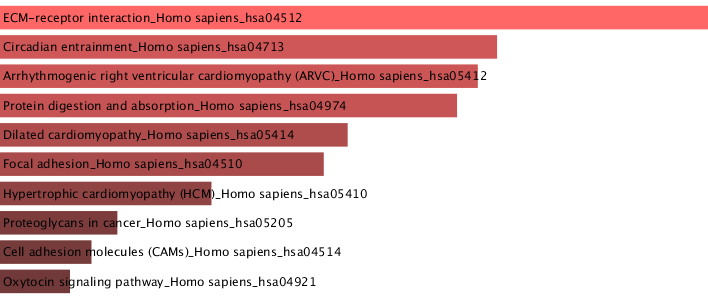

In [82]:
Image(filename='KEGG_spdef_dn_graph.png')

#### Figure 18 | Gene Set Enrichment results from KEGG 2016 library for downregulated genes in SPDEF overexpressing cells

### 4.5 Sample Enrichr Results for commonly upregulated and downregulated genes in SPDEF and FOXA3 expressing cells

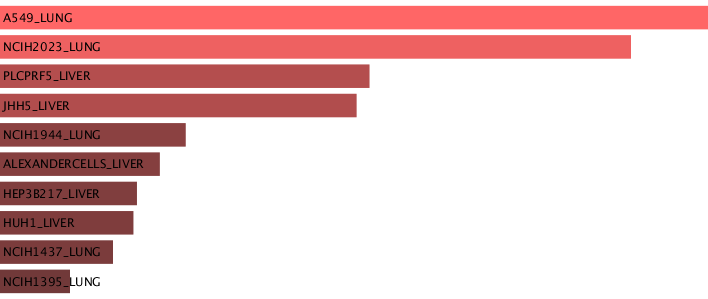

In [111]:
from IPython.display import Image
Image(filename='Cancer_Cell_Line_Encyclopedia_spdef_foxa3_up.png')

#### Figure 19 | Gene Set Enrichment results from Cancer Cell Line Encyclopedia library for common upregulated genes in both SPDEF and FOXA3 overexpressing cells identified by CD method

<a id='Small Molecule Predictions'></a>

### 5. Small Molecule Predictions

[L1000CDS<sup>2</sup>](http://amp.pharm.mssm.edu/L1000CDS2/#/index) is a library of network-based cellular signatures. It currently includes information about more than a million gene expression profiles of chemically perturbed human cell lines <a href='#Citations'> [4]</a>. L1000CDS<sup>2</sup> was used to identify small molecules that would mimic or reverse the signature, using differential gene expression signatures computed using [Characteristic Direction Method](https://bmcbioinformatics.biomedcentral.com/articles/10.1186/1471-2105-15-79).

A more detailed description of the library and CD method can be found in this publication: https://www.ncbi.nlm.nih.gov/pubmed/?term=28413689

In [63]:
import retrieve
smq_foxa_mimic=retrieve.small_molecule_query(top_500_foxa3,bottom_500_foxa3, mimic=True)[0]
smq_foxa_reverse=retrieve.small_molecule_query(top_500_foxa3,bottom_500_foxa3, mimic=False)[0]
smq_spdef_mimic=retrieve.small_molecule_query(top_500_spdef,bottom_500_spdef, mimic=True)[0]
smq_spdef_reverse=retrieve.small_molecule_query(top_500_spdef,bottom_500_spdef, mimic=False)[0]

df = pd.DataFrame([smq_foxa_mimic,smq_foxa_reverse,smq_spdef_mimic,smq_spdef_reverse])

def make_clickable(val):
    return '<a href="{}">{}</a>'.format(val,val)

df.index=['Mimic signature of FOXA3 expressing cells','Reverse signature of FOXA3 expressing cells','Mimic signature of SPDEF expressing cells','Reverse signature of SPDEF expressing cells']
df.columns=['Links to full Small Molecule Query results']
df.style.format(make_clickable)



,Links to full Small Molecule Query results
Mimic signature of FOXA3 expressing cells,http://amp.pharm.mssm.edu/L1000CDS2/#/result/59d6b022b09d47a600bd5a0c
Reverse signature of FOXA3 expressing cells,http://amp.pharm.mssm.edu/L1000CDS2/#/result/59d6b023b09d47a600bd5a0e
Mimic signature of SPDEF expressing cells,http://amp.pharm.mssm.edu/L1000CDS2/#/result/59d6b023b09d47a600bd5a10
Reverse signature of SPDEF expressing cells,http://amp.pharm.mssm.edu/L1000CDS2/#/result/59d6b023b09d47a600bd5a12


#### Table 10 | Links to full Small Molecule Query results
The table includes the links to full Small Molecule Query results. The resulting small molecules are reported, along with the cell line perturbed, dosage and time of exposure.

### Further Examination of Small Molecule Query Results
A549 cells are of most interest to this analysis, since they were used as a model to study the effect of FOXA3 and SPDEF overexpression in invasive lung mucinous adenocarcinoma. The small molecules that reverse the differential expression signature of FOXA3 in A549 cells were thus extracted from the results. Similar search for molecules that reverse SPDEF effect did not yield any results.

In [64]:
output=pd.DataFrame()
output_foxa_mimic=retrieve.small_molecule_query(top_500_foxa3,bottom_500_foxa3, mimic=True)[1].get('topMeta')
output_foxa_reverse=retrieve.small_molecule_query(top_500_foxa3,bottom_500_foxa3, mimic=False)[1].get('topMeta')
output_spdef_mimic=retrieve.small_molecule_query(top_500_spdef,bottom_500_spdef, mimic=True)[1].get('topMeta')
output_spdef_reverse=retrieve.small_molecule_query(top_500_spdef,bottom_500_spdef, mimic=False)[1].get('topMeta')



pert_id_foxa_mimic = [item.get('pert_id') for item in output_foxa_mimic if item.get('cell_id') == u"A549"]  
pert_desc_foxa_mimic = [item.get('pert_desc') for item in output_foxa_mimic if item.get('cell_id') == u"A549"]  


pert_id_foxa_reverse = [item.get('pert_id') for item in output_foxa_reverse if item.get('cell_id') == u"A549"]  
pert_desc_foxa_reverse = [item.get('pert_desc') for item in output_foxa_reverse if item.get('cell_id') == u"A549"]  
pert_overlap_foxa_reverse = [item.get('score') for item in output_foxa_reverse if item.get('cell_id') == u"A549"]  

pert_id_spdef_mimic = [item.get('pert_id') for item in output_spdef_mimic if item.get('cell_id') == u"A549"]  
pert_desc_spdef_mimic = [item.get('pert_desc') for item in output_spdef_mimic if item.get('cell_id') == u"A549"]  

pert_id_spdef_reverse = [item.get('pert_id') for item in output_spdef_reverse if item.get('cell_id') == u"A549"]  
pert_desc_spdef_reverse = [item.get('pert_desc') for item in output_spdef_reverse if item.get('cell_id') == u"A549"]  


df_pert_desc_foxa_reverse = pd.DataFrame({'Small molecule description':pert_desc_foxa_reverse,'Small molecule ID': pert_id_foxa_reverse,'Overlap score':pert_overlap_foxa_reverse})
df_pert_desc_foxa_reverse = df_pert_desc_foxa_reverse[['Small molecule description','Small molecule ID','Overlap score']]


df_pert_desc_foxa_reverse.index=range(1,len(df_pert_desc_foxa_reverse)+1)
qgrid.show_grid(df_pert_desc_foxa_reverse)

#### Table 9 |  Small Molecules that reverse the signature of FOXA3 overexpressing A549 cells 
The table includes the list of the small molecules, that were extracted from L1000CDS<sup>2</sup> library by narrowing down the search to A549 cell signatures only.The first column shows the small molecule desription, while the second column shows the small molecule ID. The overlap score is given in a third column, and is an overlap between input differentially expressed genes and signature differentially expressed genes divided by the length of the intersection between the input genes and the L1000 genes. The molecules present in the table are exprected to reverse the differential gene expression signature in A549 cells that overexpress FOXA3.

<a id='Citations'></a>

## Citations

1.  Guo M, Tomoshige K, Meister M, Muley T et al. Gene signature driving invasive mucinous adenocarcinoma of the lung. EMBO Mol Med 2017 Apr;9(4):462-481. 

2.  "The data discussed in this publication have been deposited in NCBI's Gene Expression Omnibus (Nurnberg et al., 2015) and are accessible through GEO Series accession number GSE86956 (https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE86956)."

3.  Kuleshov MV, Jones MR, Rouillard AD, et al. Enrichr: a comprehensive gene set enrichment analysis web server 2016 update. Nucleic Acids Research. 2016;44(Web Server issue):W90-W97. doi:10.1093/nar/gkw377.

4.  Duan, Q. L1000CDS2: LINCS L1000 Characteristic Direction Signatures Search Engine. npj Systems Biology and Applications. 2016.